In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import os, re, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Figure saved to ../results/Figure/training_dynamics_log_wd0.png


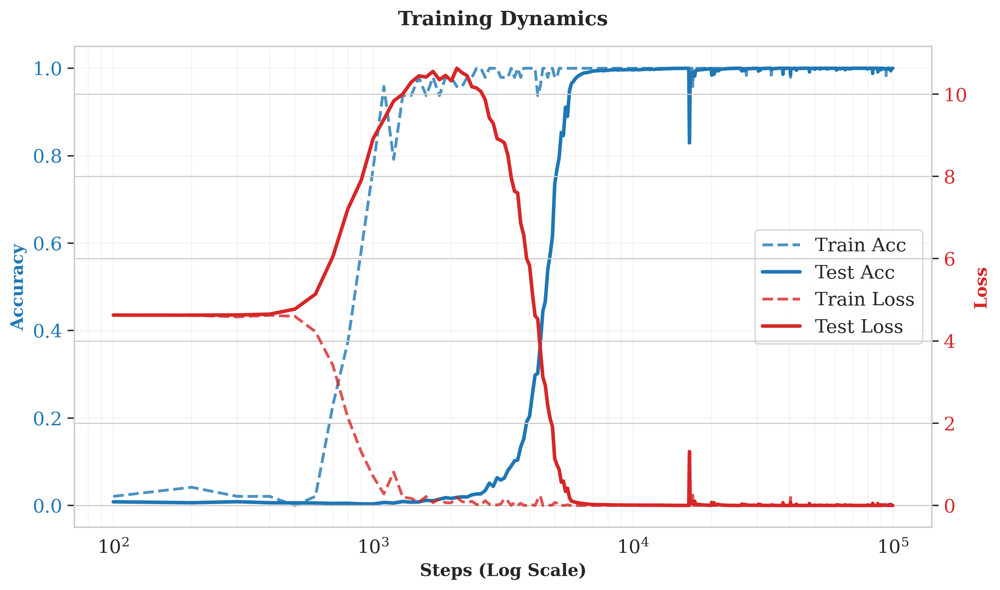

In [3]:
# Configuration for publication-quality figures
sns.set_context("paper", font_scale=1.5)
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'serif'
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.dpi'] = 300

# Define Paths
base_dir = "../results/Data/x-y/x_minus_y"
wd0_path = os.path.join(base_dir, "wd_0.0/seed42.csv")

# Setup Figure
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

def plot_metrics(ax, csv_path, title):
    if not os.path.exists(csv_path):
        ax.text(0.5, 0.5, f"Data not found:\n{csv_path}", ha='center', va='center')
        return

    df = pd.read_csv(csv_path)
    
    # Left Axis: Accuracy
    ln1 = ax.plot(df['steps'], df['train_acc'], label='Train Acc', color='#1f77b4', linestyle='--', linewidth=2, alpha=0.8)
    ln2 = ax.plot(df['steps'], df['test_acc'], label='Test Acc', color='#1f77b4', linewidth=2.5)
    
    ax.set_xlabel('Steps (Log Scale)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Accuracy', color='#1f77b4', fontsize=12, fontweight='bold')
    ax.tick_params(axis='y', labelcolor='#1f77b4')
    ax.set_ylim(-0.05, 1.05)
    ax.set_xscale('log')
    ax.grid(True, which="both", ls="-", alpha=0.2)

    # Right Axis: Loss
    ax2 = ax.twinx()
    ln3 = ax2.plot(df['steps'], df['train_loss'], label='Train Loss', color='#d62728', linestyle='--', linewidth=2, alpha=0.8)
    ln4 = ax2.plot(df['steps'], df['test_loss'], label='Test Loss', color='#d62728', linewidth=2.5)
    
    ax2.set_ylabel('Loss', color='#d62728', fontsize=12, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor='#d62728')
    
    # Title & Legend
    ax.set_title(title, fontsize=14, fontweight='bold', pad=15)
    
    # Combine legends
    lines = ln1 + ln2 + ln3 + ln4
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='center right', frameon=True, framealpha=0.9)

# Plotting
plot_metrics(ax, wd0_path, "Training Dynamics")

plt.tight_layout()
save_path = "../results/Figure/training_dynamics_log_wd0.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"Figure saved to {save_path}")
plt.show()

Loading data...
  -> Loaded step 100
  -> Loaded step 1000
  -> Loaded step 10000
  -> Loaded step 100000


/data/zjj/miniconda3/tmp/ipykernel_388589/1847454150.py:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


Detailed evolution plot saved to ../results/Figure/cma_evolution_wd0_detailed.png


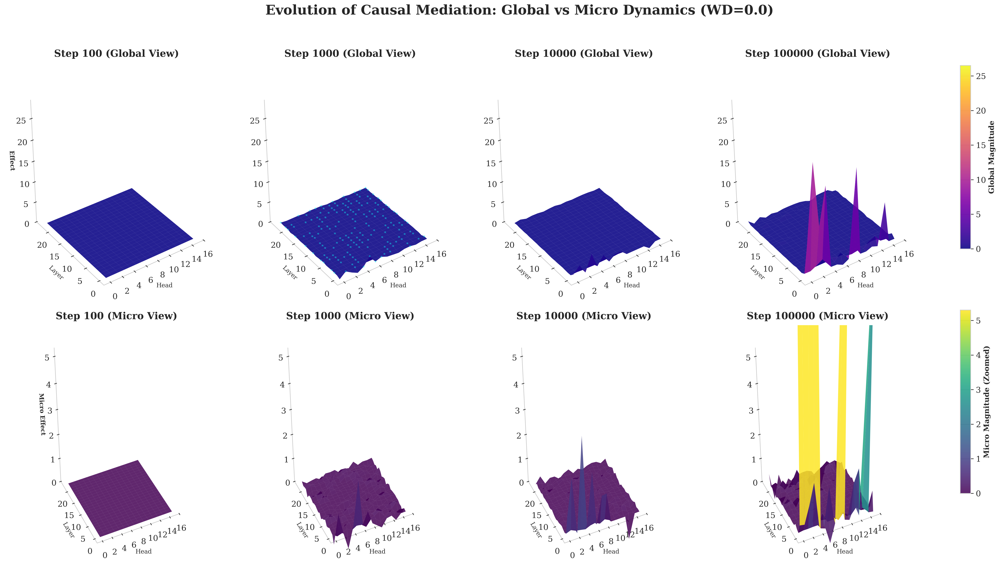

In [9]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LightSource

# Configuration
steps = [100, 1000, 10000, 100000]
base_cma_dir = "/data/zjj/test/results/Data/cma"
sigma_val = 0.3 

# Pre-load data
datasets = {}
raw_datasets = {}
global_max = 0
print("Loading data...")

for step in steps:
    csv_path = os.path.join(base_cma_dir, f"cma_wd_0.0_step_{step}.csv")
    if os.path.exists(csv_path):
        print(f"  -> Loaded step {step}")
        df = pd.read_csv(csv_path, index_col=0)
        data = df.values
        raw_datasets[step] = data
        datasets[step] = gaussian_filter(data, sigma=sigma_val)
        global_max = max(global_max, datasets[step].max())
    else:
        print(f"  [Warn] File not found: {csv_path}")

# Setup Figure (2 rows, 4 columns)
fig = plt.figure(figsize=(24, 14))
ls = LightSource(azdeg=315, altdeg=45)

# --- Row 1: Standard View (Global Scale) ---
for idx, step in enumerate(steps):
    ax = fig.add_subplot(2, 4, idx+1, projection='3d')
    
    if step in datasets:
        data_smooth = datasets[step]
        layers, heads = data_smooth.shape
        X, Y = np.meshgrid(np.arange(heads), np.arange(layers))
        
        # Main Surface
        surf = ax.plot_surface(X, Y, data_smooth, cmap='plasma', 
                               edgecolor='none', alpha=0.9, antialiased=True, 
                               rstride=1, cstride=1, linewidth=0,
                               vmin=0, vmax=global_max, shade=True, lightsource=ls)
        
        # Add Scatter Points for Step 1000 (Chaos Overlay)
        if step == 1000 and 1000 in raw_datasets:
            raw_data = raw_datasets[1000]
            # Filter for low-magnitude "chaos" points to avoid clutter
            mask = (raw_data > 0.01) & (raw_data < global_max * 0.3)
            xs, ys = np.meshgrid(np.arange(heads), np.arange(layers))
            ax.scatter(xs[mask], ys[mask], raw_data[mask], 
                       c='cyan', s=5, alpha=0.3, label='Chaotic Activations')

        # Aesthetics
        ax.set_title(f'Step {step} (Global View)', fontsize=16, fontweight='bold', pad=10)
        ax.set_zlim(0, global_max * 1.1)
        ax.view_init(elev=35, azim=-125)
        ax.set_box_aspect((1, 1, 1.2))
        
        # Clean Look
        ax.grid(False)
        ax.xaxis.pane.fill = False; ax.yaxis.pane.fill = False; ax.zaxis.pane.fill = False
        ax.xaxis.pane.set_edgecolor('w'); ax.yaxis.pane.set_edgecolor('w'); ax.zaxis.pane.set_edgecolor('w')
        
        # Labels only on edges
        if idx == 0:
            ax.set_zlabel('Effect', fontsize=10, fontweight='bold')
        ax.set_xlabel('Head', fontsize=10); ax.set_ylabel('Layer', fontsize=10)

# --- Row 2: Zoomed Z-Axis (Micro View) ---
# Focus on the bottom 20% of the range to see subtle variations
z_micro_limit = global_max * 0.2

for idx, step in enumerate(steps):
    ax = fig.add_subplot(2, 4, idx+5, projection='3d')
    
    if step in datasets:
        data_smooth = datasets[step]
        layers, heads = data_smooth.shape
        X, Y = np.meshgrid(np.arange(heads), np.arange(layers))
        
        # Surface with different colormap for micro variations
        surf_micro = ax.plot_surface(X, Y, data_smooth, cmap='viridis', 
                                     edgecolor='none', alpha=0.85, antialiased=True, 
                                     rstride=1, cstride=1, linewidth=0,
                                     vmin=0, vmax=z_micro_limit, shade=True, lightsource=ls)
        
        # Aesthetics
        ax.set_title(f'Step {step} (Micro View)', fontsize=16, fontweight='bold', pad=10)
        ax.set_zlim(0, z_micro_limit) # Zoom in Z-axis
        ax.view_init(elev=45, azim=-115) # Slightly higher angle
        ax.set_box_aspect((1, 1, 2.0)) # Highly stretched Z
        
        # Clean Look
        ax.grid(False)
        ax.xaxis.pane.fill = False; ax.yaxis.pane.fill = False; ax.zaxis.pane.fill = False
        ax.xaxis.pane.set_edgecolor('w'); ax.yaxis.pane.set_edgecolor('w'); ax.zaxis.pane.set_edgecolor('w')
        
        if idx == 0:
            ax.set_zlabel('Micro Effect', fontsize=10, fontweight='bold')
        ax.set_xlabel('Head', fontsize=10); ax.set_ylabel('Layer', fontsize=10)

# Colorbars
cbar_ax1 = fig.add_axes([0.92, 0.55, 0.01, 0.3])
cbar1 = fig.colorbar(surf, cax=cbar_ax1)
cbar1.set_label('Global Magnitude', fontsize=12, fontweight='bold')

cbar_ax2 = fig.add_axes([0.92, 0.15, 0.01, 0.3])
cbar2 = fig.colorbar(surf_micro, cax=cbar_ax2)
cbar2.set_label('Micro Magnitude (Zoomed)', fontsize=12, fontweight='bold')

plt.suptitle("Evolution of Causal Mediation: Global vs Micro Dynamics (WD=0.0)", fontsize=22, fontweight='bold', y=0.95)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])

save_path_evolution = "../results/Figure/cma_evolution_wd0_detailed.png"
os.makedirs(os.path.dirname(save_path_evolution), exist_ok=True)
plt.savefig(save_path_evolution, dpi=300, bbox_inches='tight')
print(f"Detailed evolution plot saved to {save_path_evolution}")
plt.show()

DFT analysis plot saved to ../results/Figure/dft_analysis_wd1.png


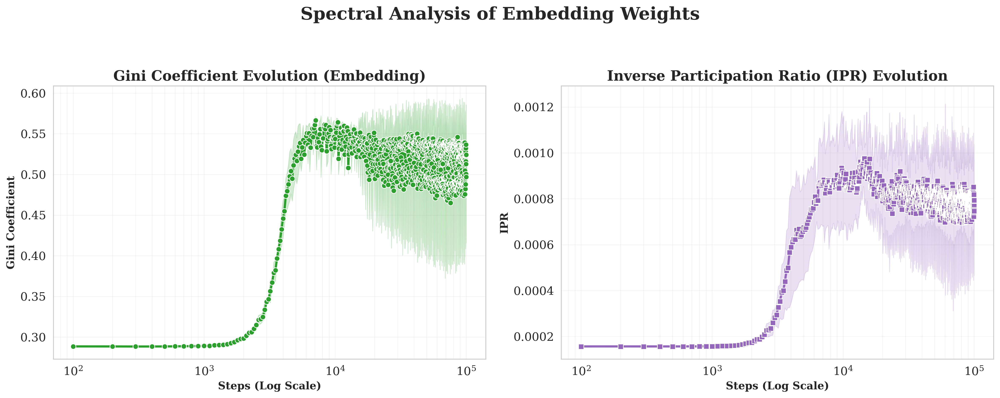

In [14]:
# Load DFT Analysis Data
dft_csv_path = "../results/Data/DFT/dft_analysis_wd1.csv"

if os.path.exists(dft_csv_path):
    df_dft = pd.read_csv(dft_csv_path)
    
    # Setup Figure
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot Gini Coefficient
    # errorbar='sd' shows the standard deviation across seeds
    sns.lineplot(data=df_dft, x='step', y='gini', ax=axes[0], 
                 color='#2ca02c', linewidth=2.5, marker='o', markersize=6, errorbar='sd')
    axes[0].set_title('Gini Coefficient Evolution (Embedding)', fontsize=16, fontweight='bold')
    axes[0].set_ylabel('Gini Coefficient', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Steps (Log Scale)', fontsize=12, fontweight='bold')
    axes[0].set_xscale('log')
    axes[0].grid(True, which="both", ls="-", alpha=0.2)
    
    # Plot IPR
    sns.lineplot(data=df_dft, x='step', y='ipr', ax=axes[1], 
                 color='#9467bd', linewidth=2.5, marker='s', markersize=6, errorbar='sd')
    axes[1].set_title('Inverse Participation Ratio (IPR) Evolution', fontsize=16, fontweight='bold')
    axes[1].set_ylabel('IPR', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Steps (Log Scale)', fontsize=12, fontweight='bold')
    axes[1].set_xscale('log')
    axes[1].grid(True, which="both", ls="-", alpha=0.2)
    
    plt.suptitle("Spectral Analysis of Embedding Weights", fontsize=20, fontweight='bold', y=1.05)
    plt.tight_layout()
    
    save_path_dft = "../results/Figure/dft_analysis_wd1.png"
    os.makedirs(os.path.dirname(save_path_dft), exist_ok=True)
    plt.savefig(save_path_dft, dpi=300, bbox_inches='tight')
    print(f"DFT analysis plot saved to {save_path_dft}")
    plt.show()
else:
    print(f"Data file not found: {dft_csv_path}. Please run utils/DFT.py first.")

Plotting 3D Manifold for 99 tokens (P=99)...


/data/zjj/miniconda3/tmp/ipykernel_388589/2910663355.py:68: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Saved 3D plot to ../results/Figure/manifold_evolution_pca_wd1_clean.png


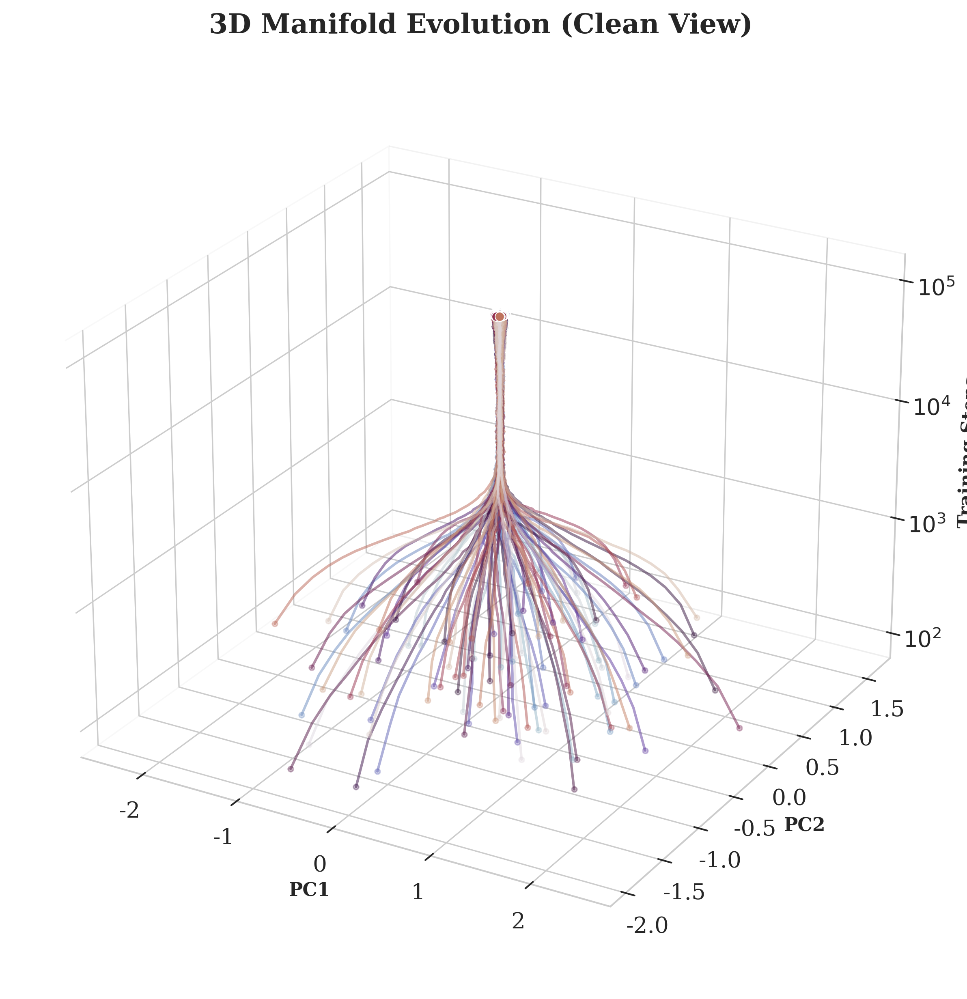

Saved 2D plot to ../results/Figure/manifold_final_state_wd1_stride8.png


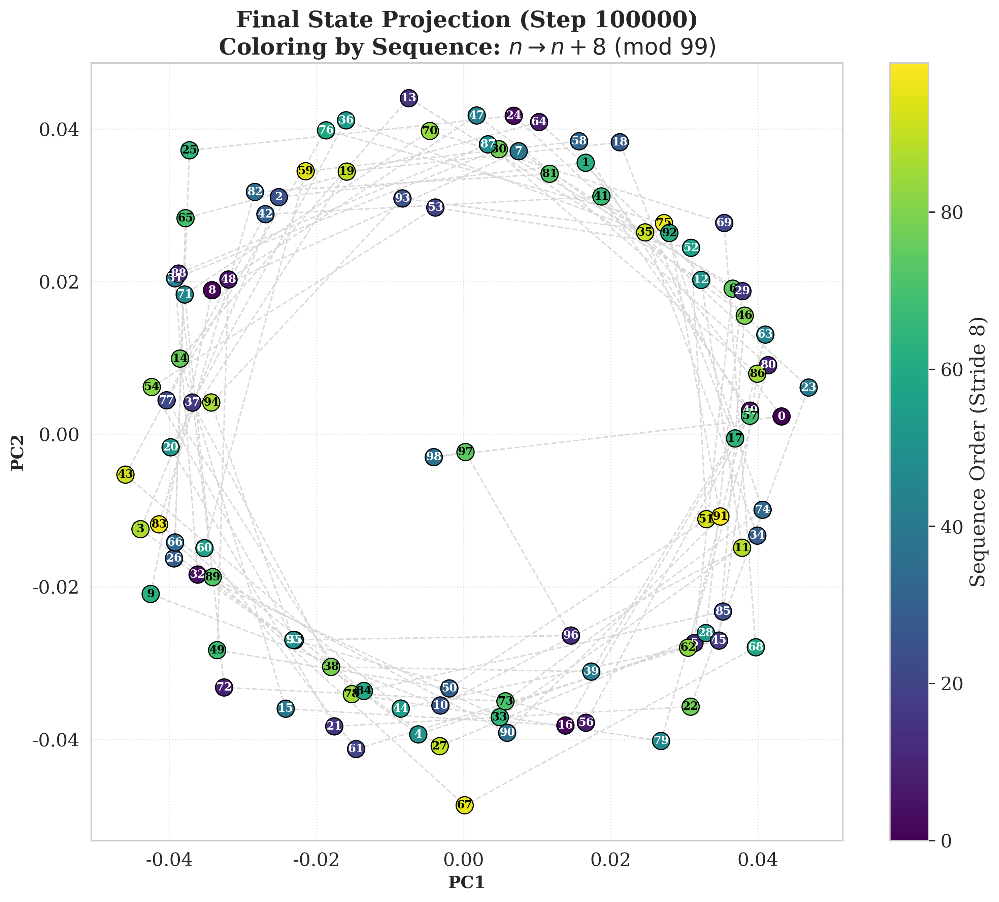

In [25]:
# Load PCA Trajectory Data
pca_csv_path = "../results/Data/t-sne/pca_trajectory_wd1.csv"

if os.path.exists(pca_csv_path):
    # Load and clean data
    df_pca = pd.read_csv(pca_csv_path)
    df_pca = df_pca.dropna(subset=['token_id', 'step', 'pc1', 'pc2'])
    
    # Get unique tokens
    tokens = np.sort(df_pca['token_id'].unique())
    num_tokens = len(tokens)
    max_step = df_pca['step'].max()
    
    if num_tokens == 0:
        print("Error: No tokens found in the data.")
    else:
        # Infer Modulus P (assuming tokens are 0..P-1)
        max_token_val = int(tokens.max())
        modulus = max_token_val + 1
        
        # ==========================================
        # Figure 1: 3D Manifold Evolution (Clean)
        # ==========================================
        try:
            fig = plt.figure(figsize=(12, 10))
            ax = fig.add_subplot(111, projection='3d')
            
            # Colormap for 3D plot: Cyclic to show ring structure
            cmap_3d = plt.get_cmap('twilight') 
            
            print(f"Plotting 3D Manifold for {num_tokens} tokens (P={modulus})...")
            
            for i, token in enumerate(tokens):
                traj = df_pca[df_pca['token_id'] == token].sort_values('step')
                xs = traj['pc1'].values
                ys = traj['pc2'].values
                steps = traj['step'].values
                
                # Avoid log(0)
                steps = np.maximum(steps, 1)
                zs = np.log10(steps)
                
                color = cmap_3d(i / num_tokens)
                
                ax.plot(xs, ys, zs, color=color, alpha=0.5, linewidth=1.5)
                ax.scatter(xs[-1], ys[-1], zs[-1], color=color, s=30, edgecolors='white', linewidth=0.5)
                ax.scatter(xs[0], ys[0], zs[0], color=color, s=10, alpha=0.3)

            # Z-axis formatting
            min_step = df_pca['step'].min()
            max_step_val = df_pca['step'].max()
            if min_step > 0:
                min_log_step = np.floor(np.log10(min_step))
                max_log_step = np.ceil(np.log10(max_step_val))
                z_ticks = np.arange(min_log_step, max_log_step + 1)
                z_labels = [f'$10^{int(i)}$' for i in z_ticks]
                ax.set_zticks(z_ticks)
                ax.set_zticklabels(z_labels)
            
            ax.set_xlabel('PC1', fontsize=11, labelpad=5, fontweight='bold')
            ax.set_ylabel('PC2', fontsize=11, labelpad=5, fontweight='bold')
            ax.set_zlabel('Training Steps', fontsize=11, labelpad=5, fontweight='bold')
            ax.set_title('3D Manifold Evolution (Clean View)', fontsize=16, fontweight='bold', pad=10)
            ax.view_init(elev=25, azim=-60)
            ax.xaxis.pane.fill = False; ax.yaxis.pane.fill = False; ax.zaxis.pane.fill = False
            ax.grid(True, linestyle='--', alpha=0.3)
            
            plt.tight_layout()
            save_path_3d = "../results/Figure/manifold_evolution_pca_wd1_clean.png"
            os.makedirs(os.path.dirname(save_path_3d), exist_ok=True)
            plt.savefig(save_path_3d, dpi=300, bbox_inches='tight')
            print(f"Saved 3D plot to {save_path_3d}")
            plt.show()
            plt.close(fig)
        except Exception as e:
            print(f"Error plotting 3D figure: {e}")
            import traceback
            traceback.print_exc()
        
        # ==========================================
        # Figure 2: 2D Final State (Stride-8 Coloring)
        # ==========================================
        try:
            fig2, ax2 = plt.subplots(figsize=(12, 10))
            
            final_df = df_pca[df_pca['step'] == max_step].sort_values('token_id')
            
            if final_df.empty:
                print("Error: No data found for the final step.")
            else:
                # Logic: Color deepens based on sequence 0, 8, 16...
                stride = 8
                
                # Generate the sequence: 0, 8, 16... mod P
                sequence = []
                visited = set()
                curr = 0
                for _ in range(modulus):
                    if curr not in visited:
                        sequence.append(curr)
                        visited.add(curr)
                    curr = (curr + stride) % modulus
                    
                # Fill any remaining numbers
                for i in range(modulus):
                    if i not in visited:
                        sequence.append(i)
                
                # Map token_id -> rank (0 to P-1)
                token_rank = {token: rank for rank, token in enumerate(sequence)}
                
                # Assign colors based on rank
                cmap_2d = plt.get_cmap('viridis')
                
                colors = []
                for t in final_df['token_id']:
                    t_int = int(t)
                    rank = token_rank.get(t_int, 0)
                    colors.append(cmap_2d(rank / modulus))
                
                # Plot Ring Structure (Connect 0-1-2...)
                pc1_vals = final_df['pc1'].values
                pc2_vals = final_df['pc2'].values
                
                if len(pc1_vals) > 0:
                    pc1_cycle = np.concatenate([pc1_vals, [pc1_vals[0]]])
                    pc2_cycle = np.concatenate([pc2_vals, [pc2_vals[0]]])
                    ax2.plot(pc1_cycle, pc2_cycle, color='gray', alpha=0.3, linestyle='--', linewidth=1, label='Ring Structure (0-1-2...)')
                
                # Scatter points with Stride-8 coloring
                scatter = ax2.scatter(final_df['pc1'], final_df['pc2'], c=colors, s=150, edgecolors='k', linewidth=0.8, zorder=2)
                
                # Annotate numbers
                for idx, row in final_df.iterrows():
                    token_id = int(row['token_id'])
                    # Determine text color based on background intensity (rank)
                    # Viridis is dark at 0, light at 1? No, Viridis is dark purple at 0, yellow at 1.
                    # So low rank (purple) -> white text. High rank (yellow) -> black text.
                    rank = token_rank.get(token_id, 0)
                    text_color = 'white' if rank < modulus * 0.6 else 'black'
                    
                    ax2.text(row['pc1'], row['pc2'], str(token_id), 
                             fontsize=8, fontweight='bold', color=text_color,
                             ha='center', va='center', zorder=3)

                # Add a colorbar
                sm = plt.cm.ScalarMappable(cmap=cmap_2d, norm=plt.Normalize(vmin=0, vmax=modulus))
                sm.set_array([])
                cbar = plt.colorbar(sm, ax=ax2, label=f'Sequence Order (Stride {stride})')
                
                # Fix: Use standard LaTeX for mod instead of \pmod which Matplotlib might not support fully in all contexts
                ax2.set_title(f'Final State Projection (Step {max_step})\nColoring by Sequence: $n \\to n+{stride} \\ (\\mathrm{{mod}}\\ {modulus})$', 
                              fontsize=16, fontweight='bold')
                ax2.set_xlabel('PC1', fontsize=12, fontweight='bold')
                ax2.set_ylabel('PC2', fontsize=12, fontweight='bold')
                ax2.grid(True, linestyle=':', alpha=0.6)
                
                # Use bbox_inches='tight' in savefig instead of tight_layout if it causes issues
                # plt.tight_layout() 
                
                save_path_2d = "../results/Figure/manifold_final_state_wd1_stride8.png"
                plt.savefig(save_path_2d, dpi=300, bbox_inches='tight')
                print(f"Saved 2D plot to {save_path_2d}")
                plt.show()
                plt.close(fig2)
            
        except Exception as e:
            print(f"Error plotting 2D figure: {e}")
            import traceback
            traceback.print_exc()

else:
    print(f"Data file not found: {pca_csv_path}. Please run utils/t-sne.py first.")

Comparison plot saved to ../results/Figure/x_plus_y_comparison_wd0_vs_wd1.png


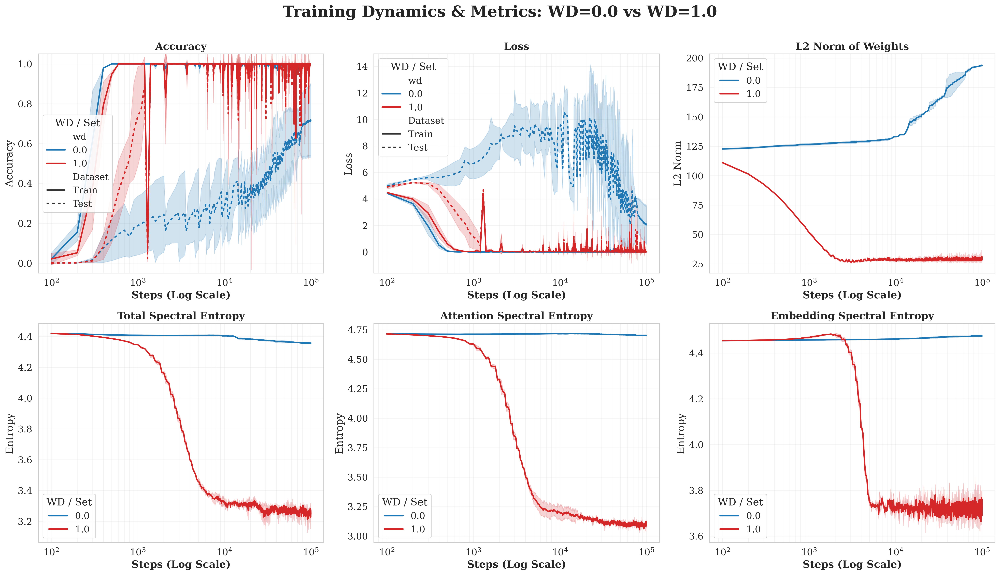

In [ ]:
# ==========================================
# Comparative Analysis: WD=0.0 vs WD=1.0
# ==========================================
import matplotlib.ticker as ticker

# Define file paths
data_files = [
    {"path": "/data/zjj/test/results/data/x_plus_y_wd_0.0_seed_42.csv", "wd": "0.0", "seed": 42},
    {"path": "/data/zjj/test/results/data/x_plus_y_wd_0.0_seed_101.csv", "wd": "0.0", "seed": 101},
    {"path": "/data/zjj/test/results/data/x_plus_y_wd_1.0_seed_42.csv", "wd": "1.0", "seed": 42},
    {"path": "/data/zjj/test/results/data/x_plus_y_wd_1.0_seed_101.csv", "wd": "1.0", "seed": 101},
]

# Load and aggregate data
dfs = []
for entry in data_files:
    if os.path.exists(entry["path"]):
        df = pd.read_csv(entry["path"])
        df['wd'] = entry["wd"]
        df['seed'] = entry["seed"]
        dfs.append(df)
    else:
        print(f"Warning: File not found: {entry['path']}")

if dfs:
    full_df = pd.concat(dfs, ignore_index=True)
    
    # Setup figure with 2 rows, 3 columns
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()
    
    # Common plotting parameters
    palette = {'0.0': '#1f77b4', '1.0': '#d62728'}
    
    # 1. Accuracy (Train & Test)
    # Melt to handle Train/Test style automatically
    df_acc = full_df.melt(id_vars=['steps', 'wd', 'seed'], value_vars=['train_acc', 'test_acc'], 
                          var_name='Dataset', value_name='Accuracy')
    df_acc['Dataset'] = df_acc['Dataset'].replace({'train_acc': 'Train', 'test_acc': 'Test'})
    
    sns.lineplot(data=df_acc, x='steps', y='Accuracy', hue='wd', style='Dataset', 
                 palette=palette, markers=False, dashes={'Train': (1, 0), 'Test': (2, 2)},
                 linewidth=2, errorbar='sd', ax=axes[0])
    
    axes[0].set_title('Accuracy', fontweight='bold')
    axes[0].set_ylim(-0.05, 1.05)
    
    # 2. Loss (Train & Test)
    df_loss = full_df.melt(id_vars=['steps', 'wd', 'seed'], value_vars=['train_loss', 'test_loss'], 
                           var_name='Dataset', value_name='Loss')
    df_loss['Dataset'] = df_loss['Dataset'].replace({'train_loss': 'Train', 'test_loss': 'Test'})
    
    sns.lineplot(data=df_loss, x='steps', y='Loss', hue='wd', style='Dataset', 
                 palette=palette, markers=False, dashes={'Train': (1, 0), 'Test': (2, 2)},
                 linewidth=2, errorbar='sd', ax=axes[1])
    
    axes[1].set_title('Loss', fontweight='bold')
    
    # 3. L2 Norm
    sns.lineplot(data=full_df, x='steps', y='l2_norm', hue='wd', 
                 palette=palette, linewidth=2, errorbar='sd', ax=axes[2])
    axes[2].set_title('L2 Norm of Weights', fontweight='bold')
    axes[2].set_ylabel('L2 Norm')
    
    # 4. Spectral Entropy
    sns.lineplot(data=full_df, x='steps', y='spectral_entropy', hue='wd', 
                 palette=palette, linewidth=2, errorbar='sd', ax=axes[3])
    axes[3].set_title('Total Spectral Entropy', fontweight='bold')
    axes[3].set_ylabel('Entropy')
    
    # 5. Attention Spectral Entropy
    sns.lineplot(data=full_df, x='steps', y='attention_spectral_entropy', hue='wd', 
                 palette=palette, linewidth=2, errorbar='sd', ax=axes[4])
    axes[4].set_title('Attention Spectral Entropy', fontweight='bold')
    axes[4].set_ylabel('Entropy')
    
    # 6. Embedding Spectral Entropy
    sns.lineplot(data=full_df, x='steps', y='embedding_spectral_entropy', hue='wd', 
                 palette=palette, linewidth=2, errorbar='sd', ax=axes[5])
    axes[5].set_title('Embedding Spectral Entropy', fontweight='bold')
    axes[5].set_ylabel('Entropy')
    
    # Formatting
    for ax in axes:
        ax.set_xscale('log')
        ax.set_xlabel('Steps (Log Scale)', fontweight='bold')
        ax.grid(True, which="both", ls="-", alpha=0.2)
        
        # Set Log Locator for X-axis to ensure 10^x ticks are visible
        ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
        ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(1.0, 10.0) * 0.1, numticks=10))
        
        # Clean up legend
        if ax.get_legend():
            ax.legend(title='WD / Set', loc='best', frameon=True, framealpha=0.9)

    plt.suptitle("Training Dynamics & Metrics: WD=0.0 vs WD=1.0", fontsize=22, fontweight='bold', y=0.95)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    save_path_comp = "../results/Figure/x_plus_y_comparison_wd0_vs_wd1.png"
    os.makedirs(os.path.dirname(save_path_comp), exist_ok=True)
    plt.savefig(save_path_comp, dpi=300, bbox_inches='tight')
    print(f"Comparison plot saved to {save_path_comp}")
    plt.show()
else:
    print("No data loaded.")

Saved BDM trajectory plot to ../results/Figure/bdm_trajectory.png


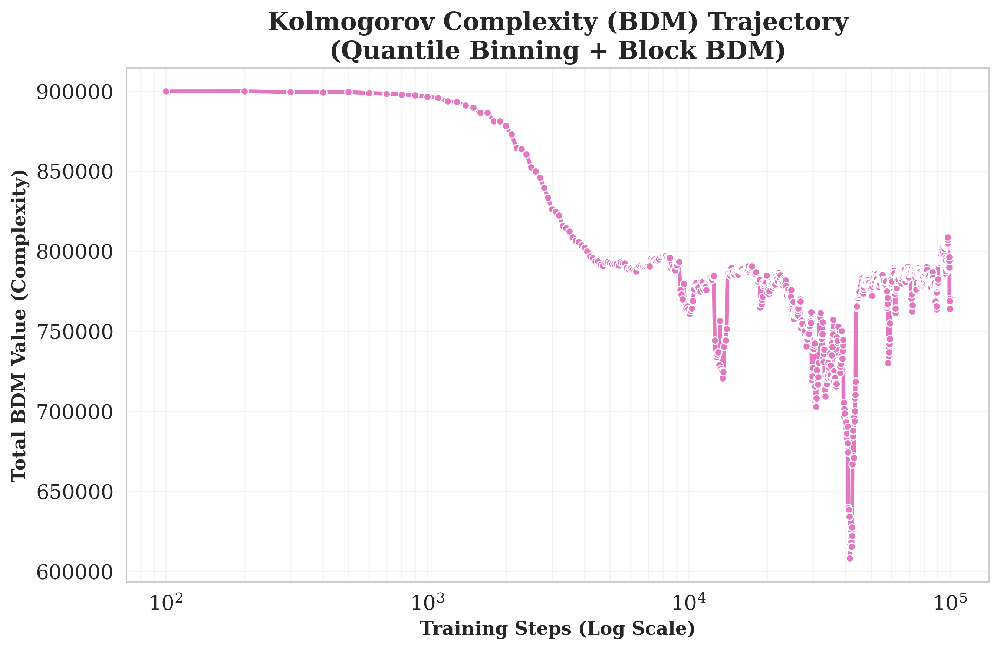


Loading quantized samples from ../results/Data/BDM/quantized_weights_samples.csv...


Saved grid evolution plot to ../results/Figure/quantized_weights_evolution_grid.png


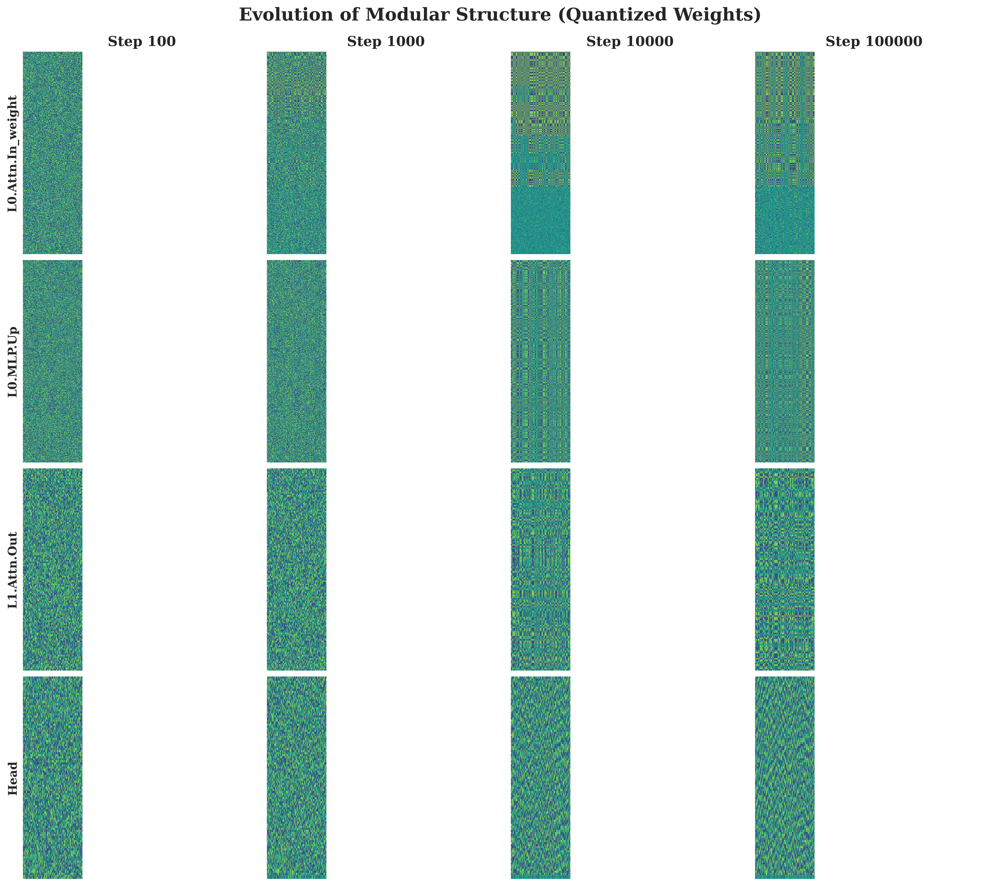

In [38]:
# ==========================================
# BDM Trajectory & Weight Clustering Visualization
# ==========================================
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from matplotlib.colors import ListedColormap

# 1. Load BDM Trajectory
bdm_csv_path = "../results/Data/BDM/bdm_trajectory.csv"
if os.path.exists(bdm_csv_path):
    df_bdm = pd.read_csv(bdm_csv_path)
    
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=df_bdm, x='Step', y='Total_BDM_Value', marker='o', linewidth=2.5, color='#e377c2')
    plt.title('Kolmogorov Complexity (BDM) Trajectory\n(Quantile Binning + Block BDM)', fontsize=16, fontweight='bold')
    plt.xlabel('Training Steps (Log Scale)', fontsize=12, fontweight='bold')
    plt.ylabel('Total BDM Value (Complexity)', fontsize=12, fontweight='bold')
    plt.xscale('log')
    plt.grid(True, which="both", ls="-", alpha=0.2)
    
    save_path_bdm = "../results/Figure/bdm_trajectory.png"
    os.makedirs(os.path.dirname(save_path_bdm), exist_ok=True)
    plt.savefig(save_path_bdm, dpi=300, bbox_inches='tight')
    print(f"Saved BDM trajectory plot to {save_path_bdm}")
    plt.show()
else:
    print(f"BDM CSV not found at {bdm_csv_path}")

# 2. Visualizing Quantized Weights Evolution (Compact Grid Layout)
samples_csv_path = "../results/Data/BDM/quantized_weights_samples.csv"
if os.path.exists(samples_csv_path):
    print(f"\nLoading quantized samples from {samples_csv_path}...")
    df_samples = pd.read_csv(samples_csv_path)
    
    # Filter out non-weight layers
    df_samples = df_samples[~df_samples['layer'].str.contains('mask', case=False)]
    
    # Define Target Steps and Layers for the Grid
    # We select representative layers to show different structural patterns
    target_steps = [100, 1000, 10000, 100000]
    target_layers = [
        'layers.0.attn.in_proj_weight',   # Attention Input (Often shows diagonal/block structure)
        'layers.0.mlp.0.weight',          # MLP Up-Projection (Sparse/Feature extraction)
        'layers.1.attn.out_proj.weight',  # Attention Output (Mixing)
        'head.weight'                     # Output Head (Class correlations)
    ]
    
    # Validate availability
    available_layers = set(df_samples['layer'].unique())
    valid_layers = [l for l in target_layers if l in available_layers]
    
    available_steps = set(df_samples['step'].unique())
    valid_steps = [s for s in target_steps if s in available_steps]
    
    if valid_layers and valid_steps:
        n_rows = len(valid_layers)
        n_cols = len(valid_steps)
        
        # Create Figure with constrained_layout for tight packing (No whitespace)
        # Adjust figsize to maintain reasonable aspect ratio for matrices
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.5 * n_cols, 3 * n_rows), constrained_layout=True)
        
        # Colormap: 4 bins (Purple -> Yellow)
        cmap = ListedColormap(sns.color_palette("viridis", 4).as_hex())
        
        for i, layer_name in enumerate(valid_layers):
            for j, step in enumerate(valid_steps):
                # Handle axes indexing for 1D or 2D arrays
                if n_rows > 1 and n_cols > 1:
                    ax = axes[i, j]
                elif n_rows > 1:
                    ax = axes[i]
                elif n_cols > 1:
                    ax = axes[j]
                else:
                    ax = axes
                
                subset = df_samples[(df_samples['step'] == step) & (df_samples['layer'] == layer_name)]
                
                if not subset.empty:
                    # Reconstruct Matrix
                    subset = subset.sort_values('row_idx')
                    matrix_cols = [c for c in subset.columns if c.startswith('col_')]
                    matrix_cols.sort(key=lambda x: int(x.split('_')[1]))
                    matrix = subset[matrix_cols].values
                    
                    # Plot Heatmap
                    sns.heatmap(matrix, ax=ax, cmap=cmap, cbar=False, xticklabels=False, yticklabels=False)
                    
                    # Column Headers (Steps) - Only on top row
                    if i == 0:
                        ax.set_title(f"Step {step}", fontsize=14, fontweight='bold')
                        
                    # Row Labels (Layer Names) - Only on left column
                    if j == 0:
                        # Shorten names for aesthetics
                        short_name = layer_name.replace('layers.', 'L').replace('.weight', '')
                        short_name = short_name.replace('attn.in_proj', 'Attn.In').replace('mlp.0', 'MLP.Up')
                        short_name = short_name.replace('attn.out_proj', 'Attn.Out').replace('head', 'Head')
                        ax.set_ylabel(short_name, fontsize=12, fontweight='bold', rotation=90)
                        
                else:
                    ax.text(0.5, 0.5, "N/A", ha='center', va='center')
                    ax.axis('off')

        plt.suptitle("Evolution of Modular Structure (Quantized Weights)", fontsize=18, fontweight='bold', y=1.03)
        
        save_path_grid = "../results/Figure/quantized_weights_evolution_grid.png"
        os.makedirs(os.path.dirname(save_path_grid), exist_ok=True)
        plt.savefig(save_path_grid, dpi=300, bbox_inches='tight')
        print(f"Saved grid evolution plot to {save_path_grid}")
        plt.show()
    else:
        print("Insufficient data (layers or steps) to create grid plot.")
else:
    print(f"Samples CSV not found at {samples_csv_path}")

Cond A files: ['fig1_curves_x-y_wd1.0_seed101.csv', 'fig1_curves_x-y_wd1.0_seed42.csv']
Cond B files: ['fig1_curves_x-y_wd0.0_seed101.csv', 'fig1_curves_x-y_wd0.0_seed42.csv']


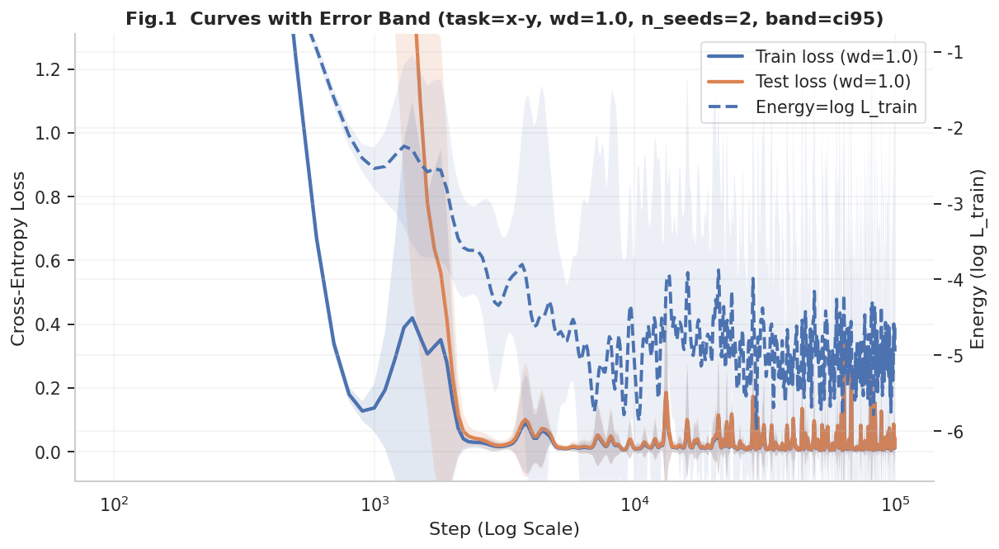

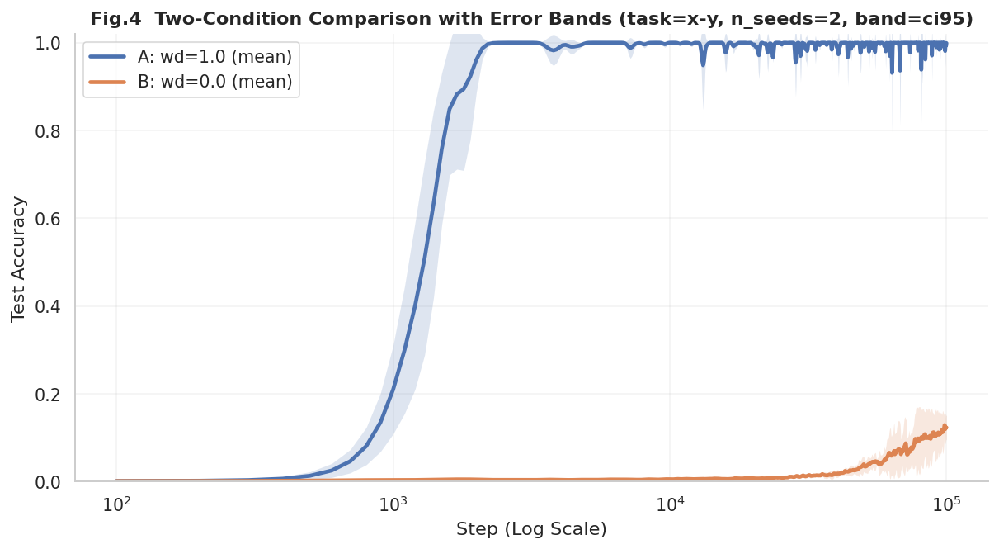

Align files A: ['fig5_align_x-y_wd1.0_seed101.csv', 'fig5_align_x-y_wd1.0_seed42.csv']


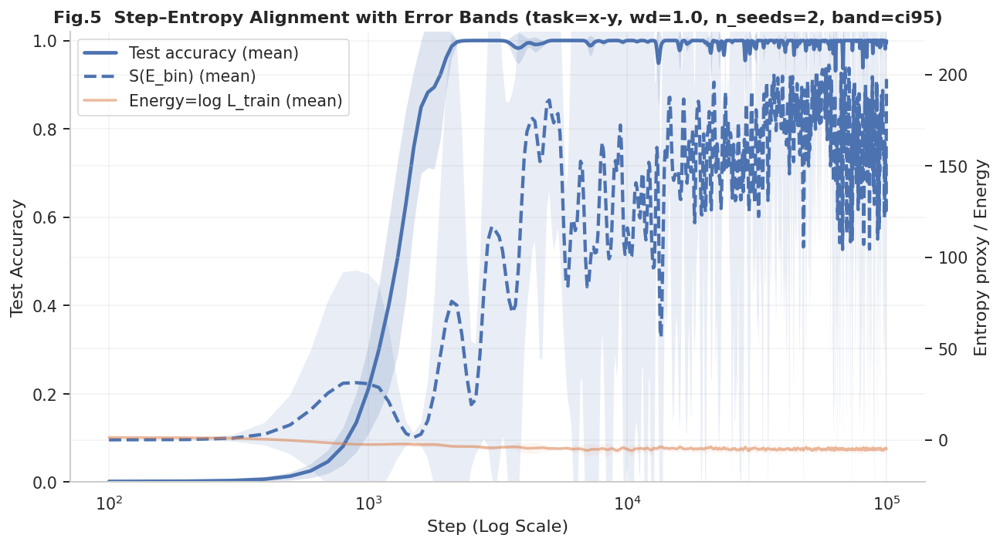

Done. Saved to: /data/zjj/test/results/Figure/wlmd_comparison


In [41]:
# ============================================
# Publication-quality plots with error bands (2 seeds)
# Fig.1 / Fig.4 / Fig.5 (Seaborn + Matplotlib)
# ============================================
import os
import glob
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

# ----------------------------
# 0) User config (edit here)
# ----------------------------
WLMD_DIR = "/data/zjj/test/results/Data/WLMD"
SAVE_DIR = os.path.join("/data/zjj/test/results/Figure", "wlmd_comparison")
os.makedirs(SAVE_DIR, exist_ok=True)
SAVE = True
DPI = 300

# Choose condition A and B for Fig.4 comparison (each condition uses 2 seeds)
task = "x-y"
condA_wd = "1.0"   # e.g., regularized / optimizer A
condB_wd = "0.0"   # e.g., non-regularized / optimizer B

# If you want to specify seeds explicitly, set seeds=[42,43] (strings)
# Otherwise the code auto-detects 2 seeds available for each condition.
seeds = None  # e.g., ["42","43"]

# Error band type: "std" or "ci95"
BAND = "ci95"
# Smoothing sigma for lines
SMOOTH_SIGMA = 1.5

# ----------------------------
# 1) Style
# ----------------------------
sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)
plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": DPI,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "grid.alpha": 0.25,
    "axes.titleweight": "bold",
})

def _ci95(std, n):
    # 95% CI half-width = 1.96 * std / sqrt(n)
    return 1.96 * std / np.sqrt(np.maximum(n, 1))

def _find_curve_csvs(task, wd):
    pat = os.path.join(WLMD_DIR, f"fig1_curves_{task}_wd{wd}_seed*.csv")
    return sorted(glob.glob(pat))

def _extract_seed(path):
    m = re.search(r"_seed(\d+)\.csv$", os.path.basename(path))
    return m.group(1) if m else None

def _load_and_tag(csv_path):
    df = pd.read_csv(csv_path).sort_values("step")
    df["seed"] = _extract_seed(csv_path)
    return df

def _aggregate_over_seeds(dfs, key="step", cols=None):
    """
    dfs: list of per-seed DataFrames (must include 'seed' and key columns)
    returns: mean_df with columns: key, mean_*, lo_*, hi_*, n
    """
    if cols is None:
        cols = ["train_loss","test_loss","train_acc","test_acc","energy_logLtrain","S_Ebin"]
    # merge long format for robust aggregation
    all_df = pd.concat(dfs, ignore_index=True)

    # some files may not have S_Ebin (curves csv doesn't); handle gracefully
    cols = [c for c in cols if c in all_df.columns]

    grp = all_df.groupby(key)
    out = pd.DataFrame({key: sorted(all_df[key].unique())})
    out["n"] = grp["seed"].nunique().reindex(out[key]).values

    for c in cols:
        m = grp[c].mean().reindex(out[key]).values
        s = grp[c].std(ddof=1).reindex(out[key]).values  # NaN if n=1
        out[f"mean_{c}"] = m
        out[f"std_{c}"] = np.nan_to_num(s, nan=0.0)

        if BAND == "std":
            half = out[f"std_{c}"].values
        elif BAND == "ci95":
            half = _ci95(out[f"std_{c}"].values, out["n"].values)
        else:
            raise ValueError("BAND must be 'std' or 'ci95'")

        out[f"lo_{c}"] = out[f"mean_{c}"] - half
        out[f"hi_{c}"] = out[f"mean_{c}"] + half

    return out

def _fill_band(ax, x, lo, hi, alpha=0.15): # Slightly more transparent
    # Smooth bands slightly too for aesthetics
    lo_s = gaussian_filter1d(lo, sigma=SMOOTH_SIGMA)
    hi_s = gaussian_filter1d(hi, sigma=SMOOTH_SIGMA)
    ax.fill_between(x, lo_s, hi_s, alpha=alpha, linewidth=0)

def _plot_smooth(ax, x, y, **kwargs):
    y_s = gaussian_filter1d(y, sigma=SMOOTH_SIGMA)
    ax.plot(x, y_s, **kwargs)

def _robust_ylim(y, pad_ratio=0.08):
    y = np.asarray(y, dtype=float)
    y = y[np.isfinite(y)]
    if y.size == 0:
        return -1, 1
    lo, hi = np.percentile(y, [1, 99])
    if abs(hi - lo) < 1e-12:
        return lo - 1.0, hi + 1.0
    pad = (hi - lo) * pad_ratio
    return lo - pad, hi + pad

# ----------------------------
# 2) Load curves for A/B (2 seeds each)
# ----------------------------
def load_condition(task, wd, seeds=None):
    files = _find_curve_csvs(task, wd)
    if not files:
        raise FileNotFoundError(f"No curve CSVs found for task={task}, wd={wd}")

    if seeds is not None:
        wanted = set(str(s) for s in seeds)
        files = [f for f in files if _extract_seed(f) in wanted]
    else:
        # auto pick first two distinct seeds
        seen = []
        picked = []
        for f in files:
            sd = _extract_seed(f)
            if sd is None: 
                continue
            if sd not in seen:
                seen.append(sd)
                picked.append(f)
            if len(picked) == 2:
                break
        files = picked

    if len(files) < 2:
        raise RuntimeError(f"Need 2 seeds for task={task}, wd={wd}, got {len(files)} files: {files}")

    dfs = [_load_and_tag(f) for f in files]
    agg = _aggregate_over_seeds(dfs, key="step", cols=["train_loss","test_loss","train_acc","test_acc","energy_logLtrain"])
    return dfs, agg, files

dfsA, aggA, filesA = load_condition(task, condA_wd, seeds=seeds)
dfsB, aggB, filesB = load_condition(task, condB_wd, seeds=seeds)

print("Cond A files:", [os.path.basename(x) for x in filesA])
print("Cond B files:", [os.path.basename(x) for x in filesB])

# ----------------------------
# 3) Fig.1 (Condition A): curves + energy with error bands
# ----------------------------
fig, ax1 = plt.subplots(figsize=(8.8, 4.9))

x = aggA["step"].values

# Loss (mean + band)
_plot_smooth(ax1, x, aggA["mean_train_loss"], label=f"Train loss (wd={condA_wd})", linewidth=2.2)
_fill_band(ax1, x, aggA["lo_train_loss"], aggA["hi_train_loss"], alpha=0.16)

_plot_smooth(ax1, x, aggA["mean_test_loss"], label=f"Test loss (wd={condA_wd})", linewidth=2.2)
_fill_band(ax1, x, aggA["lo_test_loss"], aggA["hi_test_loss"], alpha=0.16)

ax1.set_xlabel("Step (Log Scale)")
ax1.set_ylabel("Cross-Entropy Loss")
ax1.set_xscale('log')
ax1.set_title(f"Fig.1  Curves with Error Band (task={task}, wd={condA_wd}, n_seeds=2, band={BAND})")
ax1.set_ylim(*_robust_ylim(np.r_[aggA["mean_train_loss"], aggA["mean_test_loss"]]))

# Energy on twin axis
ax2 = ax1.twinx()
_plot_smooth(ax2, x, aggA["mean_energy_logLtrain"], label="Energy=log L_train", linestyle="--", linewidth=2.0)
_fill_band(ax2, x, aggA["lo_energy_logLtrain"], aggA["hi_energy_logLtrain"], alpha=0.10)
ax2.set_ylabel("Energy (log L_train)")
ax2.set_ylim(*_robust_ylim(aggA["mean_energy_logLtrain"].values))

# Legend merge
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
ax1.legend(h1 + h2, l1 + l2, loc="best", frameon=True)

plt.tight_layout()
if SAVE:
    out = os.path.join(SAVE_DIR, f"fig1_band_{task}_wd{condA_wd}.png")
    plt.savefig(out, bbox_inches="tight")
plt.show()

# ----------------------------
# 4) Fig.4: Comparison A vs B (test_acc with error bands)
# ----------------------------
fig, ax = plt.subplots(figsize=(8.8, 4.9))

xA = aggA["step"].values
xB = aggB["step"].values

_plot_smooth(ax, xA, aggA["mean_test_acc"], label=f"A: wd={condA_wd} (mean)", linewidth=2.4)
_fill_band(ax, xA, aggA["lo_test_acc"], aggA["hi_test_acc"], alpha=0.18)

_plot_smooth(ax, xB, aggB["mean_test_acc"], label=f"B: wd={condB_wd} (mean)", linewidth=2.4)
_fill_band(ax, xB, aggB["lo_test_acc"], aggB["hi_test_acc"], alpha=0.18)

ax.set_xlabel("Step (Log Scale)")
ax.set_ylabel("Test Accuracy")
ax.set_xscale('log')
ax.set_ylim(0, 1.02)
ax.set_title(f"Fig.4  Two-Condition Comparison with Error Bands (task={task}, n_seeds=2, band={BAND})")
ax.legend(loc="best", frameon=True)

plt.tight_layout()
if SAVE:
    out = os.path.join(SAVE_DIR, f"fig4_band_compare_{task}_Awd{condA_wd}_Bwd{condB_wd}.png")
    plt.savefig(out, bbox_inches="tight")
plt.show()

# ----------------------------
# 5) Fig.5: Alignment plot with error bands (needs fig5_align CSVs for each seed)
#    We will aggregate S_Ebin across seeds by reading fig5_align_{task}_wd{wd}_seed*.csv
# ----------------------------
def load_align_condition(task, wd, seeds=None):
    pat = os.path.join(WLMD_DIR, f"fig5_align_{task}_wd{wd}_seed*.csv")
    files = sorted(glob.glob(pat))
    if not files:
        raise FileNotFoundError(f"No fig5_align CSVs found for task={task}, wd={wd}")

    if seeds is not None:
        wanted = set(str(s) for s in seeds)
        files = [f for f in files if _extract_seed(f) in wanted]
    else:
        # pick first two distinct seeds
        seen = []
        picked = []
        for f in files:
            sd = _extract_seed(f)
            if sd is None: 
                continue
            if sd not in seen:
                seen.append(sd)
                picked.append(f)
            if len(picked) == 2:
                break
        files = picked

    if len(files) < 2:
        raise RuntimeError(f"Need 2 seeds for align plot task={task}, wd={wd}, got {len(files)}")

    dfs = []
    for f in files:
        d = pd.read_csv(f).sort_values("step")
        d["seed"] = _extract_seed(f)
        dfs.append(d)

    # aggregate over seeds for test_acc, S_Ebin, energy
    agg = _aggregate_over_seeds(dfs, key="step", cols=["test_acc","S_Ebin","energy_logLtrain"])
    return dfs, agg, files

dfs5A, agg5A, files5A = load_align_condition(task, condA_wd, seeds=seeds)
print("Align files A:", [os.path.basename(x) for x in files5A])

fig, ax1 = plt.subplots(figsize=(9.4, 5.2))

x = agg5A["step"].values
_plot_smooth(ax1, x, agg5A["mean_test_acc"], label="Test accuracy (mean)", linewidth=2.4)
_fill_band(ax1, x, agg5A["lo_test_acc"], agg5A["hi_test_acc"], alpha=0.18)

ax1.set_xlabel("Step (Log Scale)")
ax1.set_ylabel("Test Accuracy")
ax1.set_xscale('log')
ax1.set_ylim(0, 1.02)
ax1.set_title(f"Fig.5  Step–Entropy Alignment with Error Bands (task={task}, wd={condA_wd}, n_seeds=2, band={BAND})")

ax2 = ax1.twinx()
_plot_smooth(ax2, x, agg5A["mean_S_Ebin"], label="S(E_bin) (mean)", linestyle="--", linewidth=2.2)
_fill_band(ax2, x, agg5A["lo_S_Ebin"], agg5A["hi_S_Ebin"], alpha=0.12)

_plot_smooth(ax2, x, agg5A["mean_energy_logLtrain"], label="Energy=log L_train (mean)", alpha=0.55, linewidth=1.8)
_fill_band(ax2, x, agg5A["lo_energy_logLtrain"], agg5A["hi_energy_logLtrain"], alpha=0.08)

ax2.set_ylabel("Entropy proxy / Energy")
ax2.set_ylim(*_robust_ylim(np.r_[agg5A["mean_S_Ebin"].values, agg5A["mean_energy_logLtrain"].values],))

# Merge legend
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
ax1.legend(h1 + h2, l1 + l2, loc="best", frameon=True)

plt.tight_layout()
if SAVE:
    out = os.path.join(SAVE_DIR, f"fig5_band_align_{task}_wd{condA_wd}.png")
    plt.savefig(out, bbox_inches="tight")
plt.show()

print("Done. Saved to:", SAVE_DIR if SAVE else "(not saved)")